In [3]:
import pandas as pd
import matplotlib.pyplot as plt
import hvplot.pandas
import plotly.express as px
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report
import re

In [4]:
# upload csv Data.  All data from Kaggle.com(https://www.kaggle.com/datasets/truecue/worldsustainabilitydataset?select=WorldSustainabilityDataset.csv)
# https://www.kaggle.com/datasets/bahadirumutiscimen/cancer-death-rates-in-the-world-19902019

cancer_path = "Resources/total-cancer-deaths-by-type.csv"
econ_path = "Resources/WorldSustainabilityDataset.csv"

# Upload Raw Kaggle Data
cancer_df = pd.read_csv(cancer_path)
econ_df = pd.read_csv(econ_path)

In [5]:
cancer_df.head()

,Entity,Code,Year,Deaths - Liver cancer - Sex: Both - Age: All Ages (Number),Deaths - Kidney cancer - Sex: Both - Age: All Ages (Number),Deaths - Lip and oral cavity cancer - Sex: Both - Age: All Ages (Number),"Deaths - Tracheal, bronchus, and lung cancer - Sex: Both - Age: All Ages (Number)",Deaths - Larynx cancer - Sex: Both - Age: All Ages (Number),Deaths - Gallbladder and biliary tract cancer - Sex: Both - Age: All Ages (Number),Deaths - Malignant skin melanoma - Sex: Both - Age: All Ages (Number),...,Deaths - Brain and central nervous system cancer - Sex: Both - Age: All Ages (Number),Deaths - Non-Hodgkin lymphoma - Sex: Both - Age: All Ages (Number),Deaths - Pancreatic cancer - Sex: Both - Age: All Ages (Number),Deaths - Esophageal cancer - Sex: Both - Age: All Ages (Number),Deaths - Testicular cancer - Sex: Both - Age: All Ages (Number),Deaths - Nasopharynx cancer - Sex: Both - Age: All Ages (Number),Deaths - Other pharynx cancer - Sex: Both - Age: All Ages (Number),Deaths - Colon and rectum cancer - Sex: Both - Age: All Ages (Number),Deaths - Non-melanoma skin cancer - Sex: Both - Age: All Ages (Number),Deaths - Mesothelioma - Sex: Both - Age: All Ages (Number)
0,Afghanistan,AFG,1990,851,66,89,983,260,180,47,...,422,996,138,529,3,66,37,539,25,6
1,Afghanistan,AFG,1991,866,66,89,982,263,182,48,...,438,1010,137,535,4,67,37,542,26,7
2,Afghanistan,AFG,1992,890,68,91,989,268,185,51,...,472,1040,137,546,4,69,38,550,26,7
3,Afghanistan,AFG,1993,914,70,93,995,275,189,53,...,505,1062,139,560,5,72,39,555,27,7
4,Afghanistan,AFG,1994,933,71,94,996,282,193,54,...,526,1069,140,575,5,73,39,554,28,8


In [6]:
econ_df.head()

,Country Name,Country Code,Year,Access to electricity (% of population) - EG.ELC.ACCS.ZS,Adjusted net national income per capita (annual % growth) - NY.ADJ.NNTY.PC.KD.ZG,"Adjusted net savings, excluding particulate emission damage (% of GNI) - NY.ADJ.SVNX.GN.ZS",Adjusted savings: carbon dioxide damage (% of GNI) - NY.ADJ.DCO2.GN.ZS,Adjusted savings: natural resources depletion (% of GNI) - NY.ADJ.DRES.GN.ZS,Adjusted savings: net forest depletion (% of GNI) - NY.ADJ.DFOR.GN.ZS,Adjusted savings: particulate emission damage (% of GNI) - NY.ADJ.DPEM.GN.ZS,...,Gini index (World Bank estimate) - SI.POV.GINI,Income Classification (World Bank Definition),Individuals using the Internet (% of population) - IT.NET.USER.ZS,"Life expectancy at birth, total (years) - SP.DYN.LE00.IN","Population, total - SP.POP.TOTL",Regime Type (RoW Measure Definition),Rural population (% of total population) - SP.RUR.TOTL.ZS,Total natural resources rents (% of GDP) - NY.GDP.TOTL.RT.ZS,Urban population (% of total population) - SP.URB.TOTL.IN.ZS,World Regions (UN SDG Definition)
0,Aruba,ABW,2000,91.660398,NaN,15.392211,2.389134,0.000190,0.000190,NaN,...,NaN,High income,NaN,NaN,NaN,NaN,53.283,NaN,NaN,Latin America and Caribbean
1,Aruba,ABW,2001,100.000000,NaN,11.491930,2.509046,0.000214,0.000214,NaN,...,NaN,High income,17.1,73.853,92892.0,NaN,53.661,0.000712,46.339,Latin America and Caribbean
2,Aruba,ABW,2002,100.000000,NaN,3.893620,2.721385,0.000223,0.000223,NaN,...,NaN,High income,18.8,73.937,94992.0,NaN,54.028,0.000657,45.972,Latin America and Caribbean
3,Aruba,ABW,2003,100.000000,NaN,6.713863,2.733676,0.000243,0.000243,NaN,...,NaN,High income,20.8,74.038,97016.0,NaN,54.394,0.000700,45.606,Latin America and Caribbean
4,Aruba,ABW,2004,100.000000,NaN,9.801576,2.678363,0.000256,0.000256,NaN,...,NaN,High income,23.0,74.156,98744.0,NaN,54.760,0.000685,45.240,Latin America and Caribbean


In [7]:
#  Create list of countries from each dataset

cancer_list= cancer_df["Entity"].unique()
econ_list = econ_df["Country Name"].unique()

In [8]:
# Count identical countries in each dataset
country_count = []

for x in cancer_list:
    if x in econ_list:
        country_count.append(x)
        
print(len(country_count))

149


In [9]:
# Print list of matching countries
country_count

['Albania',
 'Algeria',
 'Angola',
 'Antigua and Barbuda',
 'Argentina',
 'Armenia',
 'Australia',
 'Austria',
 'Azerbaijan',
 'Bahrain',
 'Bangladesh',
 'Barbados',
 'Belarus',
 'Belgium',
 'Belize',
 'Benin',
 'Bhutan',
 'Bolivia',
 'Bosnia and Herzegovina',
 'Botswana',
 'Brazil',
 'Bulgaria',
 'Burkina Faso',
 'Burundi',
 'Cambodia',
 'Cameroon',
 'Canada',
 'Central African Republic',
 'Chad',
 'Chile',
 'China',
 'Colombia',
 'Comoros',
 'Costa Rica',
 "Cote d'Ivoire",
 'Croatia',
 'Cuba',
 'Cyprus',
 'Denmark',
 'Dominica',
 'Dominican Republic',
 'Ecuador',
 'El Salvador',
 'Equatorial Guinea',
 'Eritrea',
 'Estonia',
 'Eswatini',
 'Ethiopia',
 'Fiji',
 'Finland',
 'France',
 'Gabon',
 'Georgia',
 'Germany',
 'Ghana',
 'Greece',
 'Guatemala',
 'Guinea-Bissau',
 'Guyana',
 'Haiti',
 'Honduras',
 'Hungary',
 'Iceland',
 'India',
 'Indonesia',
 'Iraq',
 'Ireland',
 'Israel',
 'Italy',
 'Jamaica',
 'Japan',
 'Jordan',
 'Kazakhstan',
 'Kenya',
 'Kuwait',
 'Latvia',
 'Lebanon',
 'Les

In [10]:
# Merge Dataframes on country and year "inner" into new cancer_merge_df

cancer_merge_df = pd.merge(cancer_df, econ_df, how="inner", left_on=["Entity","Year"], right_on=["Country Name","Year"], copy=False)

In [11]:
# Review new data frame
cancer_merge_df.head()

,Entity,Code,Year,Deaths - Liver cancer - Sex: Both - Age: All Ages (Number),Deaths - Kidney cancer - Sex: Both - Age: All Ages (Number),Deaths - Lip and oral cavity cancer - Sex: Both - Age: All Ages (Number),"Deaths - Tracheal, bronchus, and lung cancer - Sex: Both - Age: All Ages (Number)",Deaths - Larynx cancer - Sex: Both - Age: All Ages (Number),Deaths - Gallbladder and biliary tract cancer - Sex: Both - Age: All Ages (Number),Deaths - Malignant skin melanoma - Sex: Both - Age: All Ages (Number),...,Gini index (World Bank estimate) - SI.POV.GINI,Income Classification (World Bank Definition),Individuals using the Internet (% of population) - IT.NET.USER.ZS,"Life expectancy at birth, total (years) - SP.DYN.LE00.IN","Population, total - SP.POP.TOTL",Regime Type (RoW Measure Definition),Rural population (% of total population) - SP.RUR.TOTL.ZS,Total natural resources rents (% of GDP) - NY.GDP.TOTL.RT.ZS,Urban population (% of total population) - SP.URB.TOTL.IN.ZS,World Regions (UN SDG Definition)
0,Albania,ALB,2000,316,40,31,748,70,26,23,...,NaN,Lower-middle income,NaN,NaN,NaN,Electoral Autocracy,58.259,NaN,NaN,Europe and Northern America
1,Albania,ALB,2001,301,42,31,734,68,26,21,...,NaN,Lower-middle income,0.325798,74.288,3060173.0,Electoral Autocracy,57.565,0.755950,42.435,Europe and Northern America
2,Albania,ALB,2002,295,47,34,765,72,28,21,...,31.7,Lower-middle income,0.390081,74.579,3051010.0,Electoral Autocracy,56.499,0.760798,43.501,Europe and Northern America
3,Albania,ALB,2003,290,53,37,806,77,30,21,...,NaN,Lower-middle income,0.971900,74.828,3039616.0,Electoral Autocracy,55.427,0.733194,44.573,Europe and Northern America
4,Albania,ALB,2004,272,57,39,817,77,31,21,...,NaN,Lower-middle income,2.420388,75.039,3026939.0,Electoral Autocracy,54.349,0.770849,45.651,Europe and Northern America


In [12]:
# View column names
cancer_merge_df.columns

Index(['Entity', 'Code', 'Year',
       'Deaths - Liver cancer - Sex: Both - Age: All Ages (Number)',
       'Deaths - Kidney cancer - Sex: Both - Age: All Ages (Number)',
       'Deaths - Lip and oral cavity cancer - Sex: Both - Age: All Ages (Number)',
       'Deaths - Tracheal, bronchus, and lung cancer - Sex: Both - Age: All Ages (Number)',
       'Deaths - Larynx cancer - Sex: Both - Age: All Ages (Number)',
       'Deaths - Gallbladder and biliary tract cancer - Sex: Both - Age: All Ages (Number)',
       'Deaths - Malignant skin melanoma - Sex: Both - Age: All Ages (Number)',
       'Deaths - Leukemia - Sex: Both - Age: All Ages (Number)',
       'Deaths - Hodgkin lymphoma - Sex: Both - Age: All Ages (Number)',
       'Deaths - Multiple myeloma - Sex: Both - Age: All Ages (Number)',
       'Deaths - Other neoplasms - Sex: Both - Age: All Ages (Number)',
       'Deaths - Breast cancer - Sex: Both - Age: All Ages (Number)',
       'Deaths - Prostate cancer - Sex: Both - Age: All A

In [13]:
# Creat keep list of columns from group for first review

keep = ['Entity','Year',
       'Deaths - Liver cancer - Sex: Both - Age: All Ages (Number)',
       'Deaths - Kidney cancer - Sex: Both - Age: All Ages (Number)',
       'Deaths - Tracheal, bronchus, and lung cancer - Sex: Both - Age: All Ages (Number)',
       'Deaths - Malignant skin melanoma - Sex: Both - Age: All Ages (Number)',
       'Deaths - Leukemia - Sex: Both - Age: All Ages (Number)',
       'Deaths - Breast cancer - Sex: Both - Age: All Ages (Number)',
       'Deaths - Prostate cancer - Sex: Both - Age: All Ages (Number)',
       'Deaths - Thyroid cancer - Sex: Both - Age: All Ages (Number)',
       'Deaths - Bladder cancer - Sex: Both - Age: All Ages (Number)',
       'Deaths - Uterine cancer - Sex: Both - Age: All Ages (Number)',
       'Deaths - Ovarian cancer - Sex: Both - Age: All Ages (Number)',
       'Deaths - Cervical cancer - Sex: Both - Age: All Ages (Number)',
       'Deaths - Non-Hodgkin lymphoma - Sex: Both - Age: All Ages (Number)',
       'Deaths - Pancreatic cancer - Sex: Both - Age: All Ages (Number)',
       'Deaths - Colon and rectum cancer - Sex: Both - Age: All Ages (Number)',
       'Adjusted savings: carbon dioxide damage (% of GNI) - NY.ADJ.DCO2.GN.ZS',
       'Adjusted savings: natural resources depletion (% of GNI) - NY.ADJ.DRES.GN.ZS',
       'Adjusted savings: net forest depletion (% of GNI) - NY.ADJ.DFOR.GN.ZS',
       'Adjusted savings: particulate emission damage (% of GNI) - NY.ADJ.DPEM.GN.ZS',
       'GDP (current US$) - NY.GDP.MKTP.CD','Continent',
       'Renewable energy consumption (% of total final energy consumption) - EG.FEC.RNEW.ZS',
       'Prevalence of undernourishment (%) - SN_ITK_DEFC - 2.1.1',
       'Proportion of population below international poverty line (%) - SI_POV_DAY1 - 1.1.1',
       'Proportion of population using basic drinking water services (%) - SP_ACS_BSRVH2O - 1.4.1',
       'Annual production-based emissions of carbon dioxide (CO2), measured in million tonnes',
       'Life expectancy at birth, total (years) - SP.DYN.LE00.IN',
       'Population, total - SP.POP.TOTL',
       'Rural population (% of total population) - SP.RUR.TOTL.ZS',
       'Total natural resources rents (% of GDP) - NY.GDP.TOTL.RT.ZS',
       'Urban population (% of total population) - SP.URB.TOTL.IN.ZS',
       'World Regions (UN SDG Definition)']

In [14]:
# Create new df to hold kept columns
cancer_clean_df = cancer_merge_df[keep]

cancer_clean_df.head()

,Entity,Year,Deaths - Liver cancer - Sex: Both - Age: All Ages (Number),Deaths - Kidney cancer - Sex: Both - Age: All Ages (Number),"Deaths - Tracheal, bronchus, and lung cancer - Sex: Both - Age: All Ages (Number)",Deaths - Malignant skin melanoma - Sex: Both - Age: All Ages (Number),Deaths - Leukemia - Sex: Both - Age: All Ages (Number),Deaths - Breast cancer - Sex: Both - Age: All Ages (Number),Deaths - Prostate cancer - Sex: Both - Age: All Ages (Number),Deaths - Thyroid cancer - Sex: Both - Age: All Ages (Number),...,Prevalence of undernourishment (%) - SN_ITK_DEFC - 2.1.1,Proportion of population below international poverty line (%) - SI_POV_DAY1 - 1.1.1,Proportion of population using basic drinking water services (%) - SP_ACS_BSRVH2O - 1.4.1,"Annual production-based emissions of carbon dioxide (CO2), measured in million tonnes","Life expectancy at birth, total (years) - SP.DYN.LE00.IN","Population, total - SP.POP.TOTL",Rural population (% of total population) - SP.RUR.TOTL.ZS,Total natural resources rents (% of GDP) - NY.GDP.TOTL.RT.ZS,Urban population (% of total population) - SP.URB.TOTL.IN.ZS,World Regions (UN SDG Definition)
0,Albania,2000,316,40,748,23,125,162,192,14,...,NaN,NaN,NaN,3.004,NaN,NaN,58.259,NaN,NaN,Europe and Northern America
1,Albania,2001,301,42,734,21,121,163,195,14,...,4.9,NaN,NaN,3.221,74.288,3060173.0,57.565,0.755950,42.435,Europe and Northern America
2,Albania,2002,295,47,765,21,124,175,206,14,...,6.1,1.6,NaN,3.748,74.579,3051010.0,56.499,0.760798,43.501,Europe and Northern America
3,Albania,2003,290,53,806,21,129,191,219,15,...,7.5,NaN,NaN,4.232,74.828,3039616.0,55.427,0.733194,44.573,Europe and Northern America
4,Albania,2004,272,57,817,21,132,198,227,15,...,8.6,NaN,NaN,4.104,75.039,3026939.0,54.349,0.770849,45.651,Europe and Northern America


In [15]:
# CReate list of for new df columns

kept_list = cancer_clean_df.columns


In [16]:
# Check null values and print column and % of null values remaining in dataset

for name in kept_list:
    null = cancer_clean_df[name].isnull().sum(axis=0)
    perc_null = (null/2831)*100
    print(f'{name} has {perc_null} nulls')

Entity has 0.0 nulls
Year has 0.0 nulls
Deaths - Liver cancer - Sex: Both - Age: All Ages (Number) has 0.0 nulls
Deaths - Kidney cancer - Sex: Both - Age: All Ages (Number) has 0.0 nulls
Deaths - Tracheal, bronchus, and lung cancer - Sex: Both - Age: All Ages (Number) has 0.0 nulls
Deaths - Malignant skin melanoma - Sex: Both - Age: All Ages (Number) has 0.0 nulls
Deaths - Leukemia - Sex: Both - Age: All Ages (Number) has 0.0 nulls
Deaths - Breast cancer - Sex: Both - Age: All Ages (Number) has 0.0 nulls
Deaths - Prostate cancer - Sex: Both - Age: All Ages (Number) has 0.0 nulls
Deaths - Thyroid cancer - Sex: Both - Age: All Ages (Number) has 0.0 nulls
Deaths - Bladder cancer - Sex: Both - Age: All Ages (Number) has 0.0 nulls
Deaths - Uterine cancer - Sex: Both - Age: All Ages (Number) has 0.0 nulls
Deaths - Ovarian cancer - Sex: Both - Age: All Ages (Number) has 0.0 nulls
Deaths - Cervical cancer - Sex: Both - Age: All Ages (Number) has 0.0 nulls
Deaths - Non-Hodgkin lymphoma - Sex: B

In [17]:
# Make a new dataframe comparing countries to high null % columns

check_nulls = cancer_clean_df[['Entity','Prevalence of undernourishment (%) - SN_ITK_DEFC - 2.1.1',
       'Proportion of population using basic drinking water services (%) - SP_ACS_BSRVH2O - 1.4.1']]

check_nulls.head()

,Entity,Prevalence of undernourishment (%) - SN_ITK_DEFC - 2.1.1,Proportion of population using basic drinking water services (%) - SP_ACS_BSRVH2O - 1.4.1
0,Albania,NaN,NaN
1,Albania,4.9,NaN
2,Albania,6.1,NaN
3,Albania,7.5,NaN
4,Albania,8.6,NaN


C:\Users\Big Pappa J\anaconda3\envs\mlenv\lib\site-packages\ipykernel_launcher.py:11: UserWarning: FixedFormatter should only be used together with FixedLocator
  # This is added back by InteractiveShellApp.init_path()


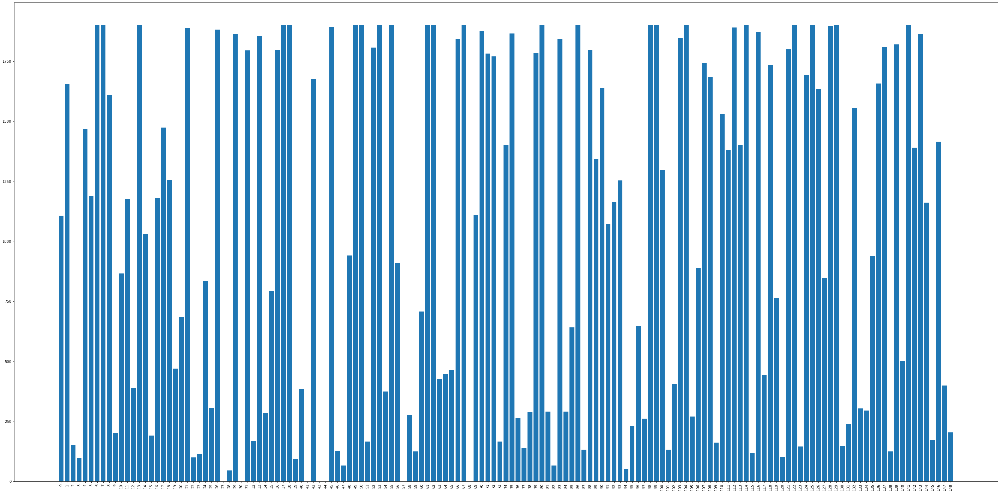

In [18]:
# Check water column for null data totals 41% of data is Null

country = check_nulls.groupby(check_nulls['Entity']).sum()
country.reset_index(inplace=True)
x = country['Entity'].tolist()
y = country['Proportion of population using basic drinking water services (%) - SP_ACS_BSRVH2O - 1.4.1']

plt.figure(figsize=(50, 25))
plt.bar(x, y)
ax = plt.gca()
ax.set_xticklabels(ax.get_xticks(), rotation = 90)

plt.show()

C:\Users\Big Pappa J\anaconda3\envs\mlenv\lib\site-packages\ipykernel_launcher.py:9: UserWarning: FixedFormatter should only be used together with FixedLocator
  if __name__ == '__main__':


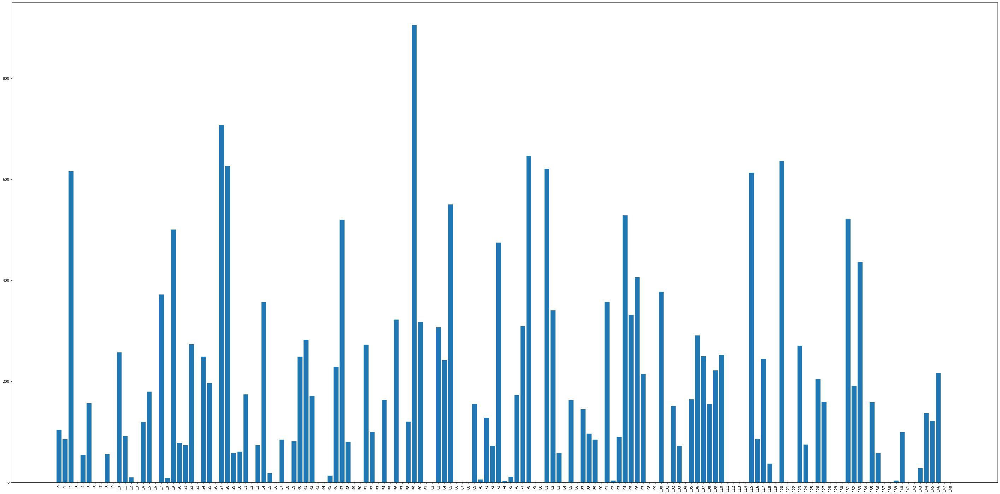

In [19]:
# Check undernourishment column for data amounts  44%  of data is Null

x = country['Entity'].tolist()
y = country['Prevalence of undernourishment (%) - SN_ITK_DEFC - 2.1.1']

plt.figure(figsize=(50, 25))
plt.bar(x, y)
ax = plt.gca()
ax.set_xticklabels(ax.get_xticks(), rotation = 90)

plt.show()

In [20]:
# Delete Columns with insufficient Data

eco_cancer_data = cancer_clean_df.drop(columns=['Prevalence of undernourishment (%) - SN_ITK_DEFC - 2.1.1',
                                  'Proportion of population below international poverty line (%) - SI_POV_DAY1 - 1.1.1',
                                  'Proportion of population using basic drinking water services (%) - SP_ACS_BSRVH2O - 1.4.1'], axis=1)
# Create list of final columns
final_column = eco_cancer_data.columns

eco_cancer_data.shape

(2831, 31)

In [21]:
# Rename columns to more manageable lengths

# Create list of new column names

rename = ['Country', 'Year',
       'Liver cancer',
       'Kidney cancer',
       'Tracheal, bronchus, and lung cancer',
       'Malignant skin melanoma',
       'Leukemia',
       'Breast cancer',
       'Prostate cancer',
       'Thyroid cancer',
       'Bladder cancer',
       'Uterine cancer',
       'Ovarian cancer',
       'Cervical cancer',
       'Non-Hodgkin lymphoma',
       'Pancreatic cancer',
       'Colon and rectum cancer',
       'Adjusted savings: carbon dioxide damage (% of GNI)',
       'Adjusted savings: natural resources depletion (% of GNI)',
       'Adjusted savings: net forest depletion (% of GNI)',
       'Adjusted savings: particulate emission damage (% of GNI)',
       'GDP (current US$)', 'Continent',
       'Renewable energy consumption',
       'Annual production-based emissions of carbon dioxide (CO2), measured in million tonnes',
       'Life expectancy at birth, total (years)',
       'Population',
       'Rural population (% of total population)',
       'Total natural resources rents (% of GDP)',
       'Urban population (% of total population)',
       'World Regions']

# Create dictionary of new and old column names
dictionary = dict(zip(final_column, rename))

# Rename columns
eco_cancer_data.rename(columns=dictionary, inplace=True)

# Check Column Names
eco_cancer_data.head()

,Country,Year,Liver cancer,Kidney cancer,"Tracheal, bronchus, and lung cancer",Malignant skin melanoma,Leukemia,Breast cancer,Prostate cancer,Thyroid cancer,...,GDP (current US$),Continent,Renewable energy consumption,"Annual production-based emissions of carbon dioxide (CO2), measured in million tonnes","Life expectancy at birth, total (years)",Population,Rural population (% of total population),Total natural resources rents (% of GDP),Urban population (% of total population),World Regions
0,Albania,2000,316,40,748,23,125,162,192,14,...,3.480355e+09,Europe,41.445000,3.004,NaN,NaN,58.259,NaN,NaN,Europe and Northern America
1,Albania,2001,301,42,734,21,121,163,195,14,...,3.922099e+09,Europe,39.125301,3.221,74.288,3060173.0,57.565,0.755950,42.435,Europe and Northern America
2,Albania,2002,295,47,765,21,124,175,206,14,...,4.348070e+09,Europe,35.895802,3.748,74.579,3051010.0,56.499,0.760798,43.501,Europe and Northern America
3,Albania,2003,290,53,806,21,129,191,219,15,...,5.611492e+09,Europe,33.751701,4.232,74.828,3039616.0,55.427,0.733194,44.573,Europe and Northern America
4,Albania,2004,272,57,817,21,132,198,227,15,...,7.184681e+09,Europe,35.934700,4.104,75.039,3026939.0,54.349,0.770849,45.651,Europe and Northern America


In [22]:
# Clean data for mock up ml unsupervised pca
eco_cancer_data_ml = eco_cancer_data.dropna()

eco_cancer_data_ml.shape

(2552, 31)

In [23]:
# Keep Country Names
country_name_df = pd.DataFrame(eco_cancer_data_ml['Country'])

eco_cancer_data_ml.drop(columns = ['Country',"Continent"], axis=1, inplace=True)
eco_cancer_data_ml.head()

C:\Users\Big Pappa J\anaconda3\envs\mlenv\lib\site-packages\pandas\core\frame.py:4913: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


,Year,Liver cancer,Kidney cancer,"Tracheal, bronchus, and lung cancer",Malignant skin melanoma,Leukemia,Breast cancer,Prostate cancer,Thyroid cancer,Bladder cancer,...,Adjusted savings: particulate emission damage (% of GNI),GDP (current US$),Renewable energy consumption,"Annual production-based emissions of carbon dioxide (CO2), measured in million tonnes","Life expectancy at birth, total (years)",Population,Rural population (% of total population),Total natural resources rents (% of GDP),Urban population (% of total population),World Regions
1,2001,301,42,734,21,121,163,195,14,26,...,0.381428,3.922099e+09,39.125301,3.221,74.288,3060173.0,57.565,0.755950,42.435,Europe and Northern America
2,2002,295,47,765,21,124,175,206,14,28,...,0.366751,4.348070e+09,35.895802,3.748,74.579,3051010.0,56.499,0.760798,43.501,Europe and Northern America
3,2003,290,53,806,21,129,191,219,15,30,...,0.354888,5.611492e+09,33.751701,4.232,74.828,3039616.0,55.427,0.733194,44.573,Europe and Northern America
4,2004,272,57,817,21,132,198,227,15,31,...,0.333259,7.184681e+09,35.934700,4.104,75.039,3026939.0,54.349,0.770849,45.651,Europe and Northern America
5,2005,246,60,804,20,131,208,230,15,31,...,0.308829,8.052076e+09,36.868301,4.199,75.228,3011487.0,53.269,1.018382,46.731,Europe and Northern America


In [24]:
eco_cancer_data_ml.dtypes

Year                                                                                       int64
Liver cancer                                                                               int64
Kidney cancer                                                                              int64
Tracheal, bronchus, and lung cancer                                                        int64
Malignant skin melanoma                                                                    int64
Leukemia                                                                                   int64
Breast cancer                                                                              int64
Prostate cancer                                                                            int64
Thyroid cancer                                                                             int64
Bladder cancer                                                                             int64
Uterine cancer                

In [25]:
X = pd.get_dummies(eco_cancer_data_ml, columns=["World Regions"])
print(X.shape)
X.head(10)

(2552, 35)


,Year,Liver cancer,Kidney cancer,"Tracheal, bronchus, and lung cancer",Malignant skin melanoma,Leukemia,Breast cancer,Prostate cancer,Thyroid cancer,Bladder cancer,...,Rural population (% of total population),Total natural resources rents (% of GDP),Urban population (% of total population),World Regions_Central and Southern Asia,World Regions_Eastern and South-Eastern Asia,World Regions_Europe and Northern America,World Regions_Latin America and Caribbean,World Regions_Northern Africa and Western Asia,World Regions_Oceania,World Regions_Sub-Saharan Africa
1,2001,301,42,734,21,121,163,195,14,26,...,57.565,0.755950,42.435,0,0,1,0,0,0,0
2,2002,295,47,765,21,124,175,206,14,28,...,56.499,0.760798,43.501,0,0,1,0,0,0,0
3,2003,290,53,806,21,129,191,219,15,30,...,55.427,0.733194,44.573,0,0,1,0,0,0,0
4,2004,272,57,817,21,132,198,227,15,31,...,54.349,0.770849,45.651,0,0,1,0,0,0,0
5,2005,246,60,804,20,131,208,230,15,31,...,53.269,1.018382,46.731,0,0,1,0,0,0,0
6,2006,224,61,780,20,126,210,229,14,31,...,52.185,1.321831,47.815,0,0,1,0,0,0,0
7,2007,211,63,768,20,122,209,233,13,31,...,51.098,1.761086,48.902,0,0,1,0,0,0,0
8,2008,208,66,796,20,125,219,245,13,32,...,50.009,1.109999,49.991,0,0,1,0,0,0,0
9,2009,207,67,809,21,126,220,256,14,33,...,48.924,0.605980,51.076,0,0,1,0,0,0,0
10,2010,214,67,826,22,127,225,269,14,34,...,47.837,1.574506,52.163,0,0,1,0,0,0,0


In [38]:
# Standardize the data with MinMAxSCaler().

X_scaled = StandardScaler().fit_transform(X)
print(X_scaled[0:5])

[[-1.65504001e+00  7.93680903e-01 -4.29961235e-01  3.97421288e-02
  -3.52118693e-01 -3.13086232e-01 -7.33536640e-01 -3.59935373e-01
  -3.05934168e-01 -7.44697923e-01 -5.13102017e-01 -7.22682768e-01
  -1.20304523e+00 -8.45310071e-01 -4.24090406e-01 -5.95473944e-01
  -8.31154562e-02 -5.22446114e-01 -2.71748029e-01 -4.60373652e-01
  -2.57552537e-01  1.16085539e-01 -2.23698894e-01  4.68058467e-01
  -2.60274666e-01  6.10267018e-01 -5.97627927e-01 -6.10267018e-01
  -2.72995084e-01 -2.90020947e-01  1.74114778e+00 -4.61440957e-01
  -3.75930569e-01 -2.10213826e-01 -5.97868555e-01]
 [-1.46179931e+00  7.67395966e-01 -3.68934473e-01  8.71287347e-02
  -3.50820344e-01 -2.70321773e-01 -6.77271531e-01 -3.10073078e-01
  -3.01903820e-01 -7.25093981e-01 -4.62088724e-01 -6.83150354e-01
  -1.16302914e+00 -8.18075590e-01 -3.58501689e-01 -5.61750974e-01
  -1.15191758e-03 -5.20160536e-01 -2.71748029e-01 -4.74047208e-01
  -2.57278905e-01  8.11084963e-03 -2.23067571e-01  4.98401047e-01
  -2.60333840e-01  5.6338

In [67]:
# Using PCA to reduce dimension to three principal components.
# YOUR CODE HERE
pca = PCA(n_components=5, random_state=32)
X_pca = pca.fit_transform(X_scaled)
X_pca

array([[-0.3948263 ,  0.13835514, -1.31428295,  0.18863322,  1.29471834],
       [-0.49997894,  0.119164  , -1.27074029,  0.19841944,  1.30391192],
       [-0.58387117,  0.10069949, -1.28193426,  0.13404082,  1.2876347 ],
       ...,
       [ 2.58839289,  0.28916839, -0.69719011, -0.369924  ,  0.09239032],
       [ 2.55409238,  0.26708031, -0.6553599 , -0.39801051,  0.08232091],
       [ 2.51419492,  0.25248586, -0.63528508, -0.44154407,  0.07292399]])

In [68]:
# Create a DataFrame with the three principal components.
# YOUR CODE HERE
pcs_df = pd.DataFrame(X_pca, columns=["PC 1", "PC 2", "PC 3",  "PC 4", "PC 5"], index = eco_cancer_data_ml.index)
print(pcs_df.shape)
pcs_df.head(10)

(2552, 5)


,PC 1,PC 2,PC 3,PC 4,PC 5
1,-0.394826,0.138355,-1.314283,0.188633,1.294718
2,-0.499979,0.119164,-1.270740,0.198419,1.303912
3,-0.583871,0.100699,-1.281934,0.134041,1.287635
4,-0.611950,0.087427,-1.335910,0.004383,1.244517
5,-0.657179,0.066945,-1.324225,-0.058391,1.225123
6,-0.776556,0.031700,-1.297629,-0.117717,1.215341
7,-0.827700,0.006508,-1.287724,-0.196393,1.192008
8,-0.852199,0.020681,-1.353790,-0.257969,1.167105
9,-0.905143,0.026293,-1.376568,-0.276670,1.160257
10,-0.951145,-0.022248,-1.273285,-0.308269,1.155031


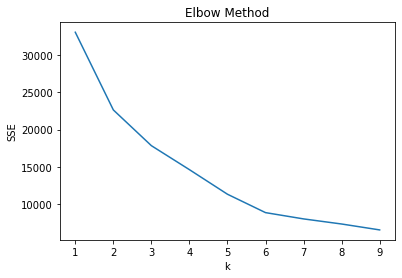

In [69]:
# Create an elbow curve to find the best value for K.
# YOUR CODE HERE
from matplotlib import pyplot as plt

sse = {}
K = range(1,10)
for k in K:
    kmeanmodel = KMeans(n_clusters=k).fit(X_pca)
    sse[k]= kmeanmodel.inertia_
    
# Plot
plt.plot(list(sse.keys()), list(sse.values()))
plt.xlabel('k')
plt.ylabel('SSE')
plt.title('Elbow Method')
plt.show()

In [70]:
# Initialize the K-Means model.

model = KMeans(n_clusters=6, random_state=32)
# Fit the model

model.fit(X_pca)
# Predict clusters

predicted = model.predict(X_pca)
predicted

array([0, 0, 0, ..., 1, 1, 1])

In [71]:
pca.explained_variance_ratio_

array([0.25028478, 0.12090998, 0.11234807, 0.07447356, 0.05911039])

In [43]:
# Create a new DataFrame including predicted clusters and cancer features.
# Concatentate the eco_cancer_data_ml and pcs_df DataFrames on the same columns.

all_cancer_clustered_df = pd.concat([eco_cancer_data_ml, pcs_df], axis=1, join="outer")

#  Add a new column, "Country" to the clustered_df DataFrame that holds the names of the cryptocurrencies. 

all_cancer_clustered_df["Country"] = country_name_df["Country"]
#  Add a new column, "Class" to the clustered_df DataFrame that holds the predictions.

all_cancer_clustered_df["Class"] = predicted

# Print the shape of the clustered_df
print(all_cancer_clustered_df.shape)
all_cancer_clustered_df.head(10)

(2552, 34)


,Year,Liver cancer,Kidney cancer,"Tracheal, bronchus, and lung cancer",Malignant skin melanoma,Leukemia,Breast cancer,Prostate cancer,Thyroid cancer,Bladder cancer,...,Population,Rural population (% of total population),Total natural resources rents (% of GDP),Urban population (% of total population),World Regions,PC 1,PC 2,PC 3,Country,Class
1,2001,301,42,734,21,121,163,195,14,26,...,3060173.0,57.565,0.755950,42.435,Europe and Northern America,-0.850305,0.254836,0.301770,Albania,0
2,2002,295,47,765,21,124,175,206,14,28,...,3051010.0,56.499,0.760798,43.501,Europe and Northern America,-0.690588,0.292430,0.273964,Albania,0
3,2003,290,53,806,21,129,191,219,15,30,...,3039616.0,55.427,0.733194,44.573,Europe and Northern America,-0.484216,0.270444,0.245386,Albania,0
4,2004,272,57,817,21,132,198,227,15,31,...,3026939.0,54.349,0.770849,45.651,Europe and Northern America,-0.383837,0.217750,0.203677,Albania,0
5,2005,246,60,804,20,131,208,230,15,31,...,3011487.0,53.269,1.018382,46.731,Europe and Northern America,-0.320699,0.213552,0.150443,Albania,0
6,2006,224,61,780,20,126,210,229,14,31,...,2992547.0,52.185,1.321831,47.815,Europe and Northern America,-0.301456,0.304202,0.082463,Albania,0
7,2007,211,63,768,20,122,209,233,13,31,...,2970017.0,51.098,1.761086,48.902,Europe and Northern America,-0.278216,0.332782,0.035376,Albania,0
8,2008,208,66,796,20,125,219,245,13,32,...,2947314.0,50.009,1.109999,49.991,Europe and Northern America,-0.147280,0.267770,0.038304,Albania,0
9,2009,207,67,809,21,126,220,256,14,33,...,2927519.0,48.924,0.605980,51.076,Europe and Northern America,-0.023382,0.257879,0.039340,Albania,0
10,2010,214,67,826,22,127,225,269,14,34,...,2913021.0,47.837,1.574506,52.163,Europe and Northern America,0.065806,0.316609,0.002797,Albania,0


In [44]:
# Creating a 3D-Scatter with the PCA data and the clusters

# fig = px.scatter_3d(all_cancer_clustered_df, x="PC 1", y="PC 2", z="PC 3", hover_name="Country", 
#                     hover_data=["Country"],color="Class", symbol="Class")
# # fig.update_layout(legend=dict(x=0,y=1))
# fig.show()

Individual kmeans by cancer type

In [45]:
cancer_list=['Liver cancer', 'Kidney cancer',
       'Tracheal, bronchus, and lung cancer', 'Malignant skin melanoma',
       'Leukemia', 'Breast cancer', 'Prostate cancer', 'Thyroid cancer',
       'Bladder cancer', 'Uterine cancer', 'Ovarian cancer', 'Cervical cancer',
       'Non-Hodgkin lymphoma', 'Pancreatic cancer', 'Colon and rectum cancer']

for x in cancer_list:
    X[x]=X[x]/X["Population"]

temp_list=[]
df_list ={}
keys = []
for name in cancer_list:
    temp_list = cancer_list
    temp_list = [x for x in cancer_list if x != name]
    k= (f'X_{name}')
    keys.append(k)
    df_list[k]=X.drop(columns = temp_list, axis=1)
        
for dict in df_list:
    df_list[dict].drop(columns="Population", axis=1)        
        
df_list['X_Liver cancer']

,Year,Liver cancer,Adjusted savings: carbon dioxide damage (% of GNI),Adjusted savings: natural resources depletion (% of GNI),Adjusted savings: net forest depletion (% of GNI),Adjusted savings: particulate emission damage (% of GNI),GDP (current US$),Renewable energy consumption,"Annual production-based emissions of carbon dioxide (CO2), measured in million tonnes","Life expectancy at birth, total (years)",...,Rural population (% of total population),Total natural resources rents (% of GDP),Urban population (% of total population),World Regions_Central and Southern Asia,World Regions_Eastern and South-Eastern Asia,World Regions_Europe and Northern America,World Regions_Latin America and Caribbean,World Regions_Northern Africa and Western Asia,World Regions_Oceania,World Regions_Sub-Saharan Africa
1,2001,3.214212e-11,1.534561,0.214370,0.0,0.381428,3.922099e+09,39.125301,3.221,74.288,...,57.565,0.755950,42.435,0,0,1,0,0,0,0
2,2002,3.169091e-11,1.688402,0.229341,0.0,0.366751,4.348070e+09,35.895802,3.748,74.579,...,56.499,0.760798,43.501,0,0,1,0,0,0,0
3,2003,3.138778e-11,1.556741,0.230807,0.0,0.354888,5.611492e+09,33.751701,4.232,74.828,...,55.427,0.733194,44.573,0,0,1,0,0,0,0
4,2004,2.968668e-11,1.248493,0.248708,0.0,0.333259,7.184681e+09,35.934700,4.104,75.039,...,54.349,0.770849,45.651,0,0,1,0,0,0,0
5,2005,2.712521e-11,1.200393,0.353888,0.0,0.308829,8.052076e+09,36.868301,4.199,75.228,...,53.269,1.018382,46.731,0,0,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2826,2014,5.043373e-12,2.310859,1.573499,0.0,1.426705,1.949552e+10,80.775002,11.973,58.410,...,67.496,5.531514,32.504,0,0,0,0,0,0,1
2827,2015,4.967399e-12,2.381654,0.844003,0.0,1.492774,1.996312e+10,81.427200,12.170,59.534,...,67.615,4.561981,32.385,0,0,0,0,0,0,1
2828,2016,4.907280e-12,2.101249,0.823740,0.0,1.496494,2.054868e+10,82.792603,10.815,60.294,...,67.704,4.473632,32.296,0,0,0,0,0,0,1
2829,2017,4.845058e-12,2.102515,1.300127,0.0,1.422511,1.901533e+10,83.492996,10.247,60.812,...,67.763,4.844665,32.237,0,0,0,0,0,0,1


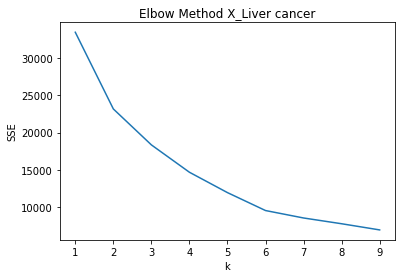

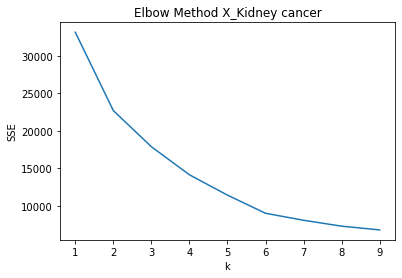

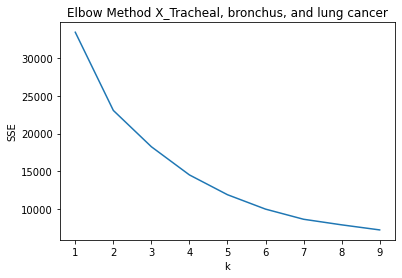

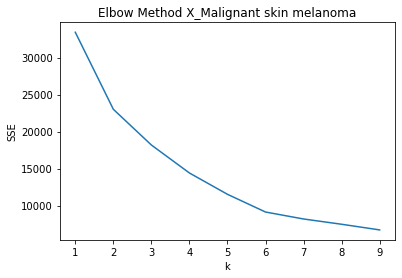

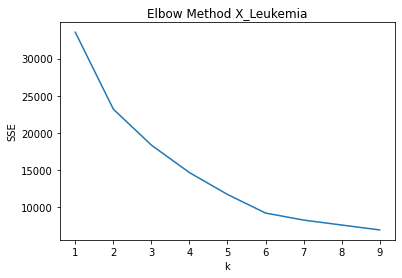

...

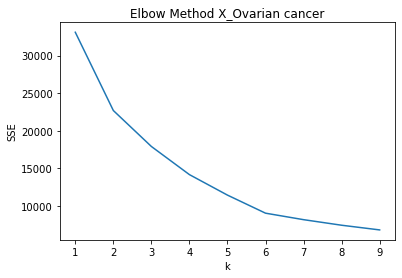

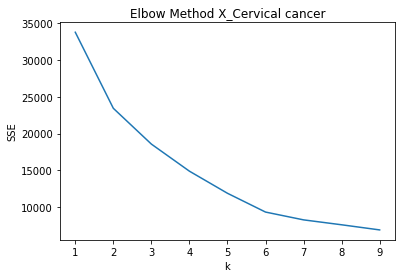

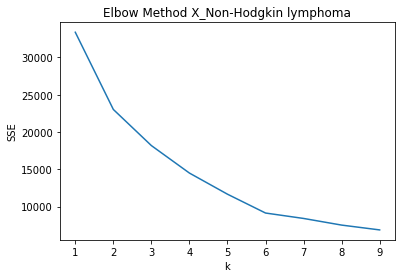

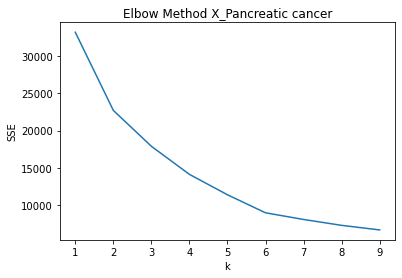

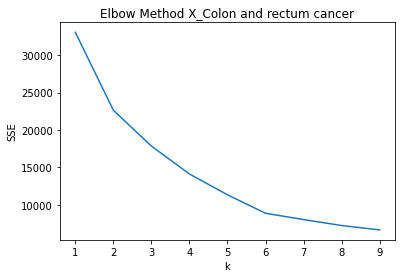

In [72]:
# Create Elbow Curves by looping through dataframes in df_list dictionary

for dict in keys:
    X_scaled = StandardScaler().fit_transform(df_list[dict])
    # Using PCA to reduce dimension to three principal components.
    pca = PCA(n_components=5, random_state=32)
    X_pca = pca.fit_transform(X_scaled)
    pcs_df = pd.DataFrame(X_pca, columns=["PC 1", "PC 2", "PC 3","PC 4","PC 5"], index = df_list[dict].index)
    # Create an elbow curve to find the best value for K
    sse = {}
    K = range(1,10)
    for k in K:
        kmeanmodel = KMeans(n_clusters=k).fit(X_pca)
        sse[k]= kmeanmodel.inertia_

    # Plot
    plt.plot(list(sse.keys()), list(sse.values()))
    plt.xlabel('k')
    plt.ylabel('SSE')
    plt.title(f'Elbow Method {dict}')
    plt.show()

In [73]:
#  Run kmeans run across each cancer data set 
pca_dfs = ['X_Liver', 'X_Kidney', 'X_Tracheal', 'X_melanoma', 'X_Leukemia',
           'X_Breast', 'X_Prostate', 'X_Thyroid', 'X_Bladder', 'X_Uterine', 'X_Ovarian',
           'X_Cervical', 'X_Non-Hodgkin', 'X_Pancreatic', 'X_Colon']

# Set up Scaled Dict
one_cancer_predicted_dict = {}
count = -1

for dict in keys:
    X_scaled = StandardScaler().fit_transform(df_list[dict])
    pca = PCA(n_components=5, random_state=32)
    X_pca = pca.fit_transform(X_scaled)
    pcs_df = pd.DataFrame(X_pca, columns=["PC 1", "PC 2", "PC 3","PC 4","PC 5"], index = df_list[dict].index)
    # initiate kmeans model
    model = KMeans(n_clusters=6, random_state=32)
    # Fit the model
    model.fit(X_pca)
    # Predict clusters
    predicted = model.predict(X_pca)

# Create a new DataFrame including predicted clusters and cancer features.
# Concatentate the eco_cancer_data_ml and pcs_df DataFrames on the same columns.
    count += 1
    one_cancer_predicted_dict[pca_dfs[count]] = pd.concat([df_list[dict], pcs_df], axis=1, join="outer")

#  Add a new column, "Country" to the clustered_df DataFrame that holds the names of the cryptocurrencies. 

    one_cancer_predicted_dict[pca_dfs[count]]["Country"] = country_name_df["Country"]
#  Add a new column, "Class" to the clustered_df DataFrame that holds the predictions.

    one_cancer_predicted_dict[pca_dfs[count]]["Class"] = predicted

In [74]:
one_cancer_predicted_dict['X_Non-Hodgkin'].tail()

,Year,Non-Hodgkin lymphoma,Adjusted savings: carbon dioxide damage (% of GNI),Adjusted savings: natural resources depletion (% of GNI),Adjusted savings: net forest depletion (% of GNI),Adjusted savings: particulate emission damage (% of GNI),GDP (current US$),Renewable energy consumption,"Annual production-based emissions of carbon dioxide (CO2), measured in million tonnes","Life expectancy at birth, total (years)",...,World Regions_Northern Africa and Western Asia,World Regions_Oceania,World Regions_Sub-Saharan Africa,PC 1,PC 2,PC 3,PC 4,PC 5,Country,Class
2826,2014,5.037956e-13,2.310859,1.573499,0.0,1.426705,1.949552e+10,80.775002,11.973,58.410,...,0,0,1,2.643517,0.266687,-0.458063,-0.436433,-0.419964,Zimbabwe,0
2827,2015,5.030278e-13,2.381654,0.844003,0.0,1.492774,1.996312e+10,81.427200,12.170,59.534,...,0,0,1,2.595339,0.321383,-0.565357,-0.439042,-0.439446,Zimbabwe,0
2828,2016,5.080000e-13,2.101249,0.823740,0.0,1.496494,2.054868e+10,82.792603,10.815,60.294,...,0,0,1,2.579567,0.329639,-0.634553,-0.524698,-0.386490,Zimbabwe,0
2829,2017,5.032545e-13,2.102515,1.300127,0.0,1.422511,1.901533e+10,83.492996,10.247,60.812,...,0,0,1,2.545107,0.305744,-0.593605,-0.544771,-0.353737,Zimbabwe,0
2830,2018,5.036471e-13,2.003068,2.085152,0.0,1.422511,1.952362e+10,81.363602,11.341,61.195,...,0,0,1,2.505145,0.290118,-0.574836,-0.576620,-0.304361,Zimbabwe,0


In [62]:
# Move ditionary item dataframes

X_Liver = one_cancer_predicted_dict['X_Liver']
X_Kidney = one_cancer_predicted_dict['X_Kidney']
X_Tracheal = one_cancer_predicted_dict['X_Tracheal']
X_melanoma = one_cancer_predicted_dict['X_melanoma']
X_Leukemia = one_cancer_predicted_dict['X_Leukemia']
X_Breast = one_cancer_predicted_dict['X_Breast']
X_Prostate = one_cancer_predicted_dict['X_Prostate']
X_Thyroid = one_cancer_predicted_dict['X_Thyroid']
X_Bladder = one_cancer_predicted_dict['X_Bladder']
X_Uterine = one_cancer_predicted_dict['X_Uterine']
X_Ovarian = one_cancer_predicted_dict['X_Ovarian']
X_Ovarian = one_cancer_predicted_dict['X_Ovarian']
X_Cervical = one_cancer_predicted_dict['X_Cervical']
X_Non_Hodgkin = one_cancer_predicted_dict['X_Non-Hodgkin']
X_Pancreatic = one_cancer_predicted_dict['X_Pancreatic']
X_Colon = one_cancer_predicted_dict['X_Colon']


In [49]:
# Creating a 3D-Scatter with the PCA data and the clusters
# for dict in  pca_dfs:

#     fig = px.scatter_3d(one_cancer_predicted_dict[dict], x="PC 1", y="PC 2", z="PC 3", hover_name="Country", 
#                         hover_data=["Country"],color="Class", symbol="Class")
#     fig.show()

In [50]:
one_cancer_predicted_dict['X_Liver']['Liver cancer'].describe()

count    2.552000e+03
mean     2.828562e-11
std      1.542879e-10
min      1.466401e-14
25%      9.717837e-13
50%      3.484671e-12
75%      1.211314e-11
max      1.922262e-09
Name: Liver cancer, dtype: float64

<AxesSubplot:ylabel='Frequency'>

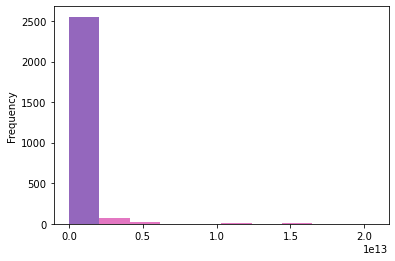

In [51]:
one_cancer_predicted_dict['X_Liver'].plot.hist(by='Liver cancer',bins=10, legend=False)

In [75]:
y = one_cancer_predicted_dict['X_Liver']['Liver cancer']
X = one_cancer_predicted_dict['X_Liver'].drop(columns=['Liver cancer',"PC 1", "PC 2", "PC 3", "PC 4","PC 5","Country"], axis=1)

In [76]:
# Splitting into Train and Test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=78)

In [77]:
# Fit model
model = LinearRegression()

# Learning stage
model.fit(X_train, y_train)

# Predict
y_pred = model.predict(X_test)

In [78]:
training_score = model.score(X_train, y_train)
testing_score = model.score(X_test, y_test)

print(f"Training Score: {training_score}")
print(f"Testing Score: {testing_score}")

Training Score: 0.29820793820222147
Testing Score: 0.15686552834782397


Liver cancer Training Score: 0.9890372473930177
Liver cancer Testing Score: 0.9672369741887533


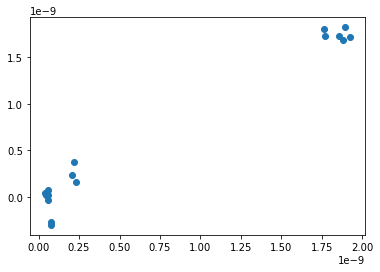

Kidney cancer Training Score: 0.9998934538870431
Kidney cancer Testing Score: 0.9997222733439936


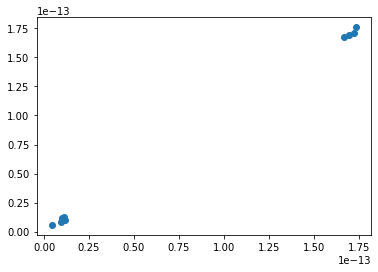

Tracheal, bronchus, and lung cancer Training Score: 0.36879071835007915
Tracheal, bronchus, and lung cancer Testing Score: 0.37941348692761356


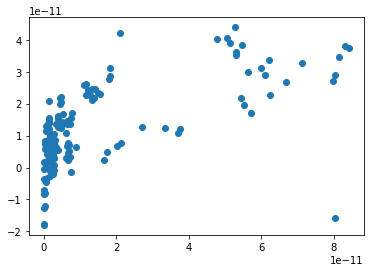

Malignant skin melanoma Training Score: 0.9999444125096497
Malignant skin melanoma Testing Score: 0.999849105122065


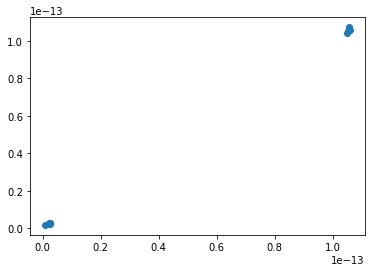

Leukemia Training Score: 0.2863883945190726
Leukemia Testing Score: 0.34001734828274544


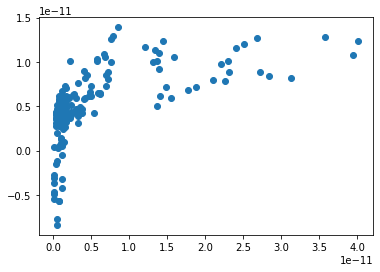

Breast cancer Training Score: 0.765007653719493
Breast cancer Testing Score: 0.7001725431810197


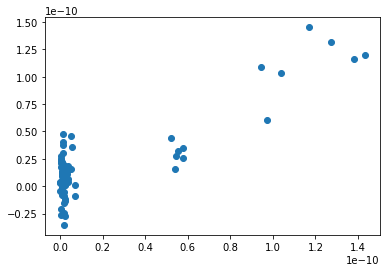

Prostate cancer Training Score: 0.2633267333204182
Prostate cancer Testing Score: 0.36095452986542287


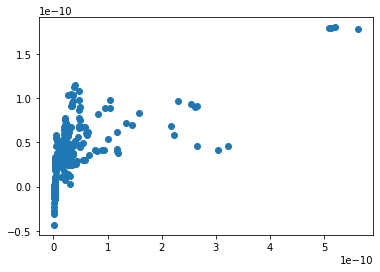

Thyroid cancer Training Score: 0.8450104736591091
Thyroid cancer Testing Score: 0.6853853518393298


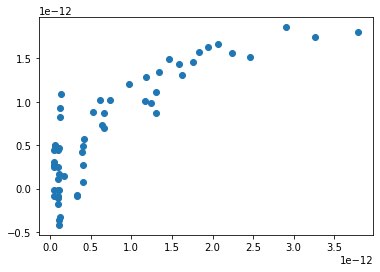

Bladder cancer Training Score: 0.9999298467211948
Bladder cancer Testing Score: 0.9999267381697131


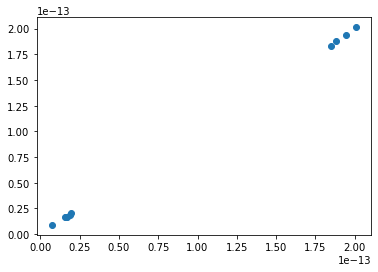

Uterine cancer Training Score: 0.6638958108931372
Uterine cancer Testing Score: 0.6819294498187516


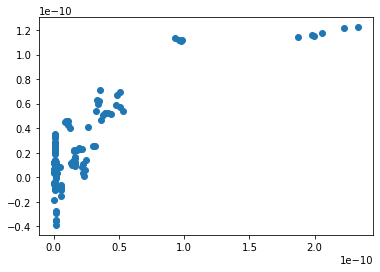

Ovarian cancer Training Score: 0.9997575077796992
Ovarian cancer Testing Score: 0.9997193205653973


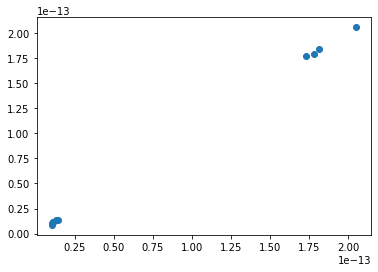

Cervical cancer Training Score: 0.9798066228391834
Cervical cancer Testing Score: 0.9843814293953153


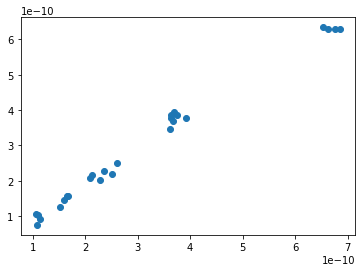

Non-Hodgkin lymphoma Training Score: 0.9630750376639053
Non-Hodgkin lymphoma Testing Score: 0.9302668044518727


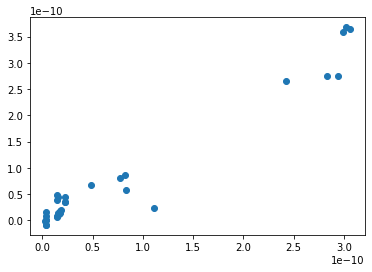

Pancreatic cancer Training Score: 0.3933831443624437
Pancreatic cancer Testing Score: 0.5293224817629503


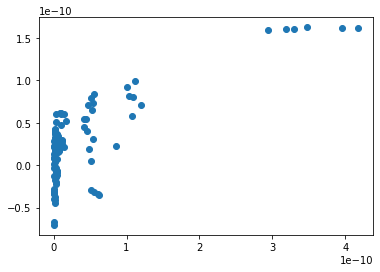

Colon and rectum cancer Training Score: 0.6990159739773476
Colon and rectum cancer Testing Score: 0.17686138701454424


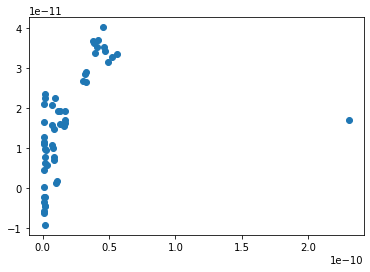

In [83]:
#  Create for loop from one_cancer_predicted_dict 
count=-1

for name in one_cancer_predicted_dict:
    count += 1
    run_df = one_cancer_predicted_dict[name][one_cancer_predicted_dict[name]["Class"]==4]
    y = run_df[cancer_list[count]]
    X = run_df.drop(columns=[cancer_list[count],"PC 1", "PC 2", "PC 3", "PC 4","PC 5","Country"], axis=1)
    
    # Splitting into Train and Test sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=78)
    
    # Fit model
    model = LinearRegression()

    # Learning stage
    model.fit(X_train, y_train)

    # Predict
    y_pred = model.predict(X_test)
    
    # Calc Tarining Scores 
    training_score = model.score(X_train, y_train)
    testing_score = model.score(X_test, y_test)
    
    print(f"{cancer_list[count]} Training Score: {training_score}")
    print(f"{cancer_list[count]} Testing Score: {testing_score}")
    plt.scatter(y_test,y_pred)
    plt.show()